In [30]:
import numpy as np
import pandas as pd
from datetime import datetime
from sklearn.preprocessing import LabelEncoder

df = pd.read_csv(r"file:///C:\Users\admin\Desktop\DIgethic\projectarbeit\PRSA_data_2010.1.1-2014.12.31.csv", header=0, index_col=0)
df.columns = ['year', 'month', 'day', 'hour', 'pollution', 'DEWPoint', 'temperature', 'pressure', 'windDirection','windSpeed', 'snow', 'rain']

# combining time columns to a single column "Date"
df['Date']=pd.to_datetime(df[["year", "month", "day", "hour"]])

# Move last column to the first
temp_cols=df.columns.tolist()
new_cols=temp_cols[-1:] + temp_cols[:-1]
df=df[new_cols]

# Remove 'year', 'month', 'day', 'hour' columns
df.drop(df.columns[[1, 2, 3, 4]], axis = 1, inplace = True)

# take the rows where pollution is not NaN values
df.dropna(inplace = True)

df.set_index('Date')


#df.describe()


,pollution,DEWPoint,temperature,pressure,windDirection,windSpeed,snow,rain
Date,,,,,,,,
2010-01-02 00:00:00,129.0,-16,-4.0,1020.0,SE,1.79,0,0
2010-01-02 01:00:00,148.0,-15,-4.0,1020.0,SE,2.68,0,0
2010-01-02 02:00:00,159.0,-11,-5.0,1021.0,SE,3.57,0,0
2010-01-02 03:00:00,181.0,-7,-5.0,1022.0,SE,5.36,1,0
2010-01-02 04:00:00,138.0,-7,-5.0,1022.0,SE,6.25,2,0
...,...,...,...,...,...,...,...,...
2014-12-31 19:00:00,8.0,-23,-2.0,1034.0,NW,231.97,0,0
2014-12-31 20:00:00,10.0,-22,-3.0,1034.0,NW,237.78,0,0
2014-12-31 21:00:00,10.0,-22,-3.0,1034.0,NW,242.70,0,0


In [2]:
df1 = df[[ 'pollution', 'DEWPoint', 'temperature', 'pressure', 'windDirection', 'windSpeed', 'snow', 'rain']]

In [3]:
df1.columns

Index(['pollution', 'DEWPoint', 'temperature', 'pressure', 'windDirection',
       'windSpeed', 'snow', 'rain'],
      dtype='object')

<AxesSubplot:>

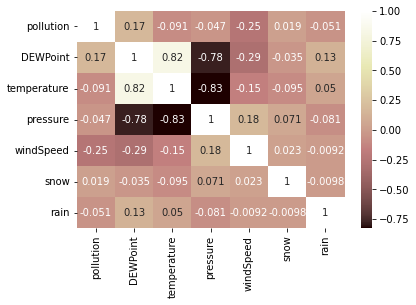

In [4]:
import seaborn as sns


df3 = df1.drop('windDirection', axis=1)

# calculate the correlation matrix
Var_Corr = df3.corr()

# plot the heatmap and annotation on it
sns.heatmap(Var_Corr, xticklabels=Var_Corr.columns, yticklabels=Var_Corr.columns,cmap="pink", annot=True)


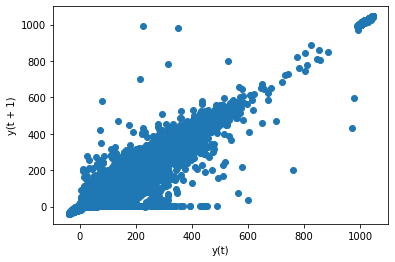

In [5]:
import matplotlib.pyplot as plt
from pandas.plotting import lag_plot

lag_plot(df3)
plt.show()

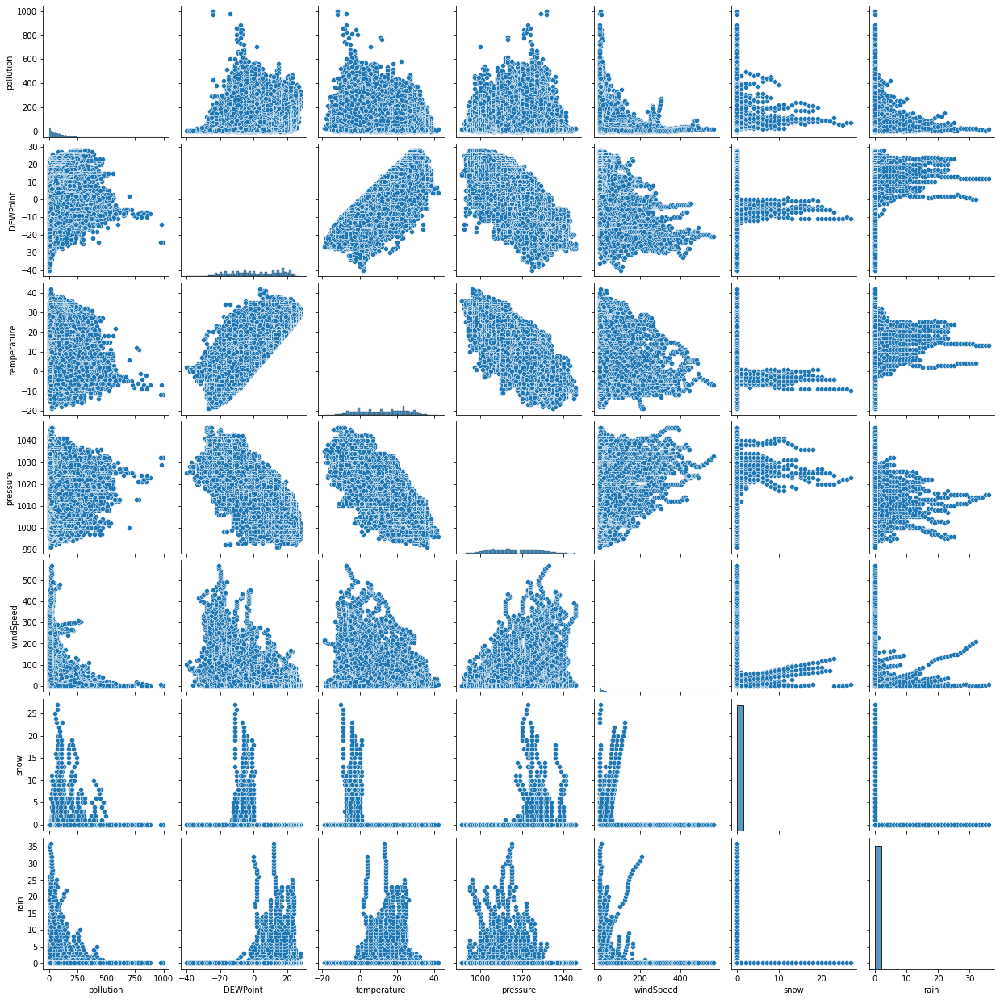

In [6]:
sns.pairplot(df3)

In [7]:
# Encode categorical values
values = df1.values
encoder = LabelEncoder()
values[:,4] = encoder.fit_transform(values[:,4])
values = values.astype('float32')
values[:,4]

array([2., 2., 2., ..., 1., 1., 1.], dtype=float32)

In [8]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler(feature_range=(0, 1))
scaled_dataset = scaler.fit_transform(values)

In [9]:
newdf = pd.DataFrame(scaled_dataset)
newdf.columns = ['pollution', 'DEWPoint', 'temperature', 'pressure', 'windDirection','windSpeed', 'snow', 'rain']


newdf

,pollution,DEWPoint,temperature,pressure,windDirection,windSpeed,snow,rain
0,0.129779,0.352941,0.245902,0.527273,0.666667,0.002372,0.000000,0.0
1,0.148893,0.367647,0.245902,0.527273,0.666667,0.003947,0.000000,0.0
2,0.159960,0.426471,0.229508,0.545454,0.666667,0.005522,0.000000,0.0
3,0.182093,0.485294,0.229508,0.563637,0.666667,0.008690,0.037037,0.0
4,0.138833,0.485294,0.229508,0.563637,0.666667,0.010265,0.074074,0.0
...,...,...,...,...,...,...,...,...
41752,0.008048,0.250000,0.278689,0.781818,0.333333,0.409741,0.000000,0.0
41753,0.010060,0.264706,0.262295,0.781818,0.333333,0.420023,0.000000,0.0
41754,0.010060,0.264706,0.262295,0.781818,0.333333,0.428731,0.000000,0.0
41755,0.008048,0.264706,0.245902,0.781818,0.333333,0.435845,0.000000,0.0


<Figure size 864x360 with 0 Axes>

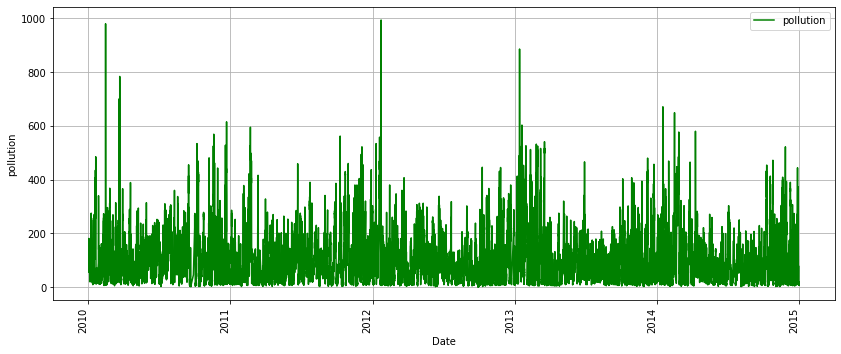

<Figure size 864x360 with 0 Axes>

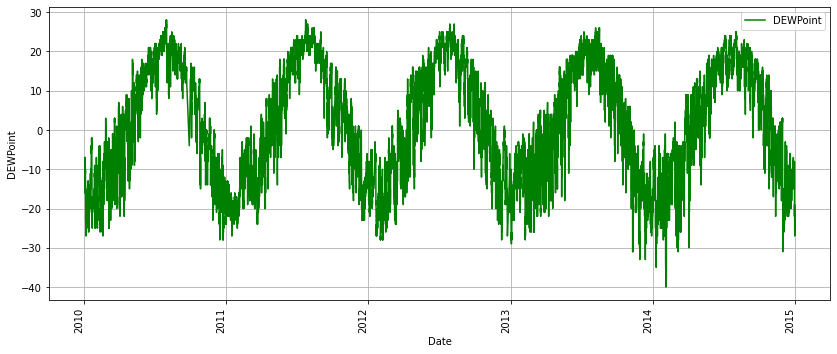

<Figure size 864x360 with 0 Axes>

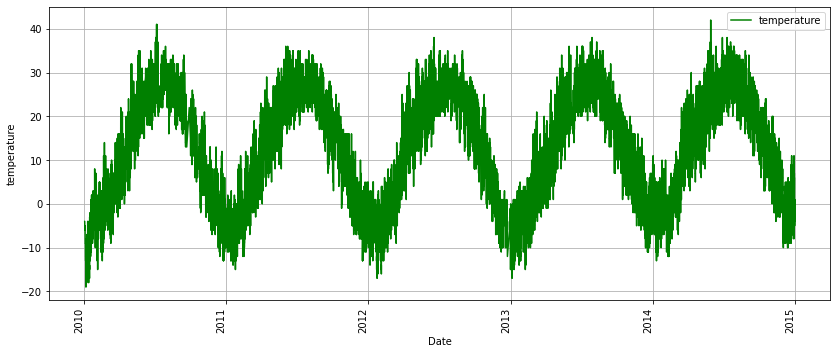

<Figure size 864x360 with 0 Axes>

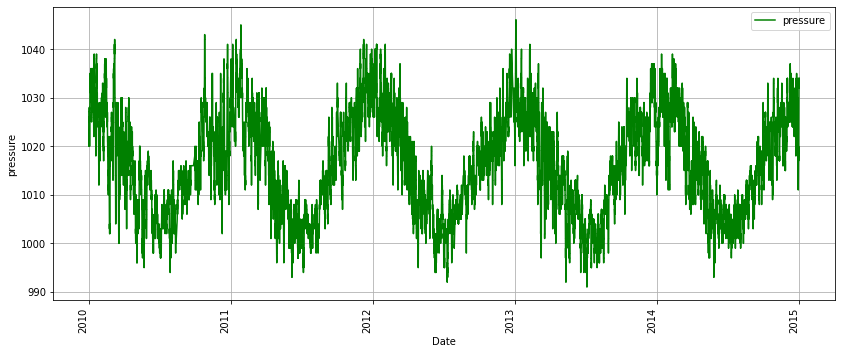

<Figure size 864x360 with 0 Axes>

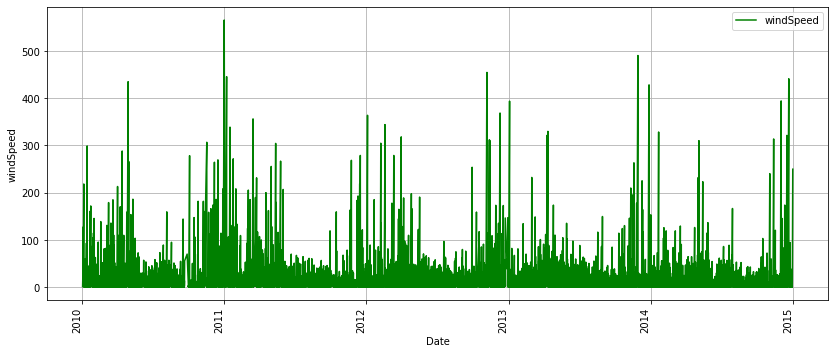

<Figure size 864x360 with 0 Axes>

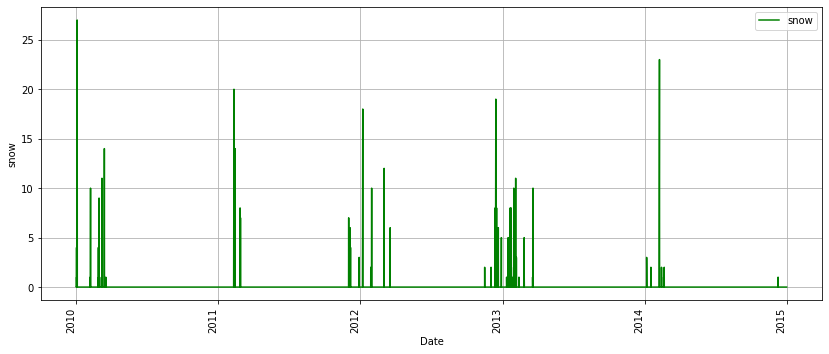

<Figure size 864x360 with 0 Axes>

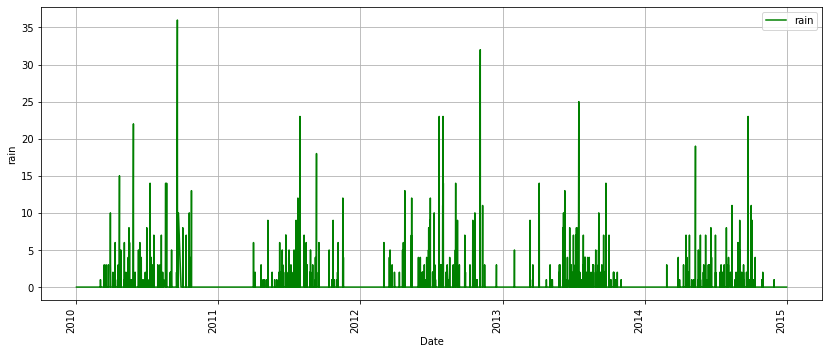

In [10]:
df3 = df1.drop("windDirection", axis=1)
df3

for d in df3.columns:
    
    df2 = df[[ 'Date', str(d)]]
    plt.figure(figsize=[12, 5]); # Set dimensions for figure
    df2.plot(x='Date', y=str(d), figsize = (14, 6), legend = True, color='g')
    plt.ylabel(str(d))
    plt.xlabel('Date')
    plt.xticks(rotation=90)
    plt.grid(True)
    plt.show()

In [11]:
# Creating window and lag size
lookback = 5
for i in newdf.columns:
    for j in range(lookback):
        newdf[str(i)+str(j+1)] = newdf[i].diff(j+1)
    

In [12]:
newdf.dropna(inplace=True)

In [13]:
newdf

,pollution,DEWPoint,temperature,pressure,windDirection,windSpeed,snow,rain,pollution1,pollution2,...,snow1,snow2,snow3,snow4,snow5,rain1,rain2,rain3,rain4,rain5
5,0.109658,0.485294,0.213115,0.563637,0.666667,0.011840,0.111111,0.0,-0.029175,-0.072435,...,0.037037,0.074074,0.111111,0.111111,0.111111,0.0,0.0,0.0,0.0,0.0
6,0.105634,0.485294,0.213115,0.581818,0.666667,0.015008,0.148148,0.0,-0.004024,-0.033199,...,0.037037,0.074074,0.111111,0.148148,0.148148,0.0,0.0,0.0,0.0,0.0
7,0.124748,0.485294,0.229508,0.600000,0.666667,0.018176,0.000000,0.0,0.019115,0.015091,...,-0.148148,-0.111111,-0.074074,-0.037037,0.000000,0.0,0.0,0.0,0.0,0.0
8,0.120724,0.470588,0.213115,0.600000,0.666667,0.021344,0.000000,0.0,-0.004024,0.015091,...,0.000000,-0.148148,-0.111111,-0.074074,-0.037037,0.0,0.0,0.0,0.0,0.0
9,0.132797,0.485294,0.229508,0.618183,0.666667,0.024512,0.000000,0.0,0.012072,0.008048,...,0.000000,0.000000,-0.148148,-0.111111,-0.074074,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41752,0.008048,0.250000,0.278689,0.781818,0.333333,0.409741,0.000000,0.0,-0.002012,-0.001006,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
41753,0.010060,0.264706,0.262295,0.781818,0.333333,0.420023,0.000000,0.0,0.002012,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
41754,0.010060,0.264706,0.262295,0.781818,0.333333,0.428731,0.000000,0.0,0.000000,0.002012,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
41755,0.008048,0.264706,0.245902,0.781818,0.333333,0.435845,0.000000,0.0,-0.002012,-0.002012,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0


In [14]:
split_index = int(newdf.shape[0]*0.7) # the index at which to split df into train and test
    
# ...train
X_train = newdf.drop('pollution',axis=1).values[:split_index]
y_train = newdf['pollution'].values[:split_index]

# ...test
X_test = newdf.drop('pollution',axis=1).values[split_index:] 
y_test = newdf['pollution'].values[split_index:] 

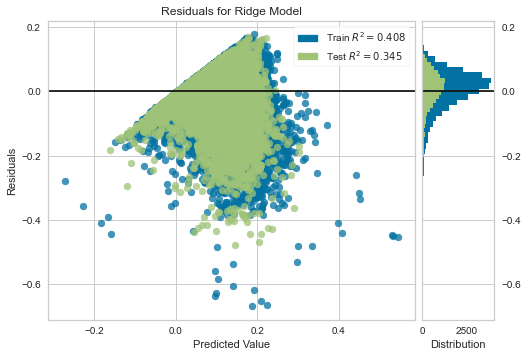

<AxesSubplot:title={'center':'Residuals for Ridge Model'}, xlabel='Predicted Value', ylabel='Residuals'>

In [15]:
from sklearn.linear_model import Ridge
from yellowbrick.regressor import ResidualsPlot

model = Ridge()
visualizer = ResidualsPlot(model)

visualizer.fit(X_train,y_train)  # Fit the training data to the visualizer
visualizer.score(X_test, y_test)  # Evaluate the model on the test data
visualizer.show() 

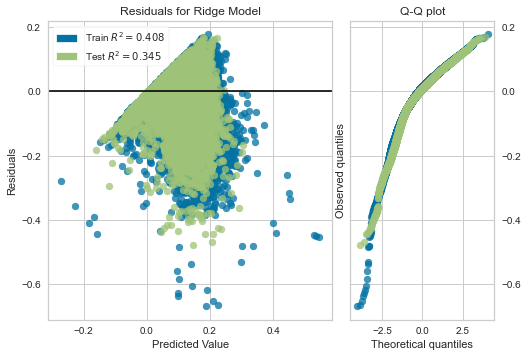

<AxesSubplot:title={'center':'Residuals for Ridge Model'}, xlabel='Predicted Value', ylabel='Residuals'>

In [16]:
visualizer = ResidualsPlot(model, hist=False, qqplot=True)
visualizer.fit(X_train, y_train)
visualizer.score(X_test, y_test)
visualizer.show()

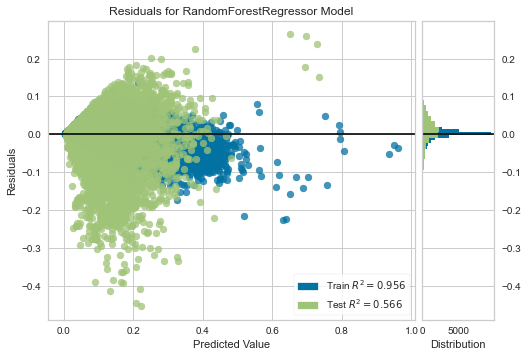

In [17]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split as tts
from yellowbrick.regressor import residuals_plot
viz = residuals_plot(RandomForestRegressor(), X_train, y_train, X_test, y_test)

In [18]:
# Set Date index for predictiv Model
x = df[split_index:].reset_index()

date_diff = len(x)-len(y_test)
x = x[date_diff:]




In [19]:
print(date_diff)

5


mean_squared_error: 0.0054
Test RMSE: 0.0737
Mean absolute error :0.052354064


Text(0.5, 1.0, 'Linear Regression')

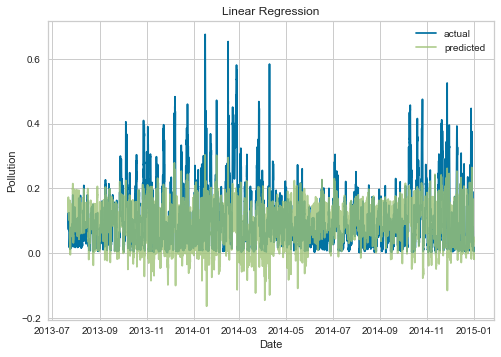

In [20]:
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error
import math 
from sklearn.metrics import mean_absolute_error as mae

# Model Training
from sklearn.linear_model import LinearRegression
model = LinearRegression()
model.fit(X_train,y_train)
pred_val = model.predict(X_test)

mean_squared_error_lr = mean_squared_error(y_test, pred_val)
rmse = math.sqrt(mean_squared_error_lr)
print('mean_squared_error: %.4f' % mean_squared_error_lr)
print('Test RMSE: %.4f' % rmse)
error = mae(y_test, pred_val)
print("Mean absolute error :"+ str(error))

plt.plot(x.Date,y_test,label='actual')
plt.plot(x.Date,pred_val,label='predicted',alpha=0.8)
plt.legend(loc="upper right")
plt.xlabel('Date')
plt.ylabel('Pollution')
plt.title("Linear Regression")

mean_squared_error: 0.0048
Test RMSE: 0.0696
Mean absolute error : 0.048501625712031336


Text(0.5, 1.0, 'Desision Tree')

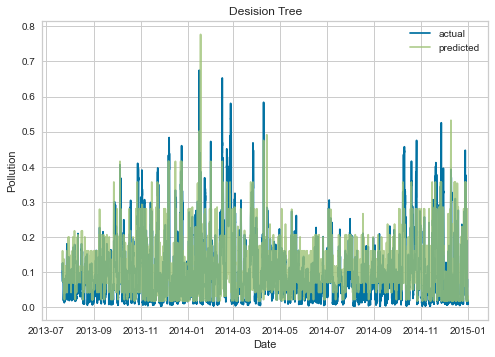

In [21]:
from sklearn import tree
from sklearn.tree import DecisionTreeRegressor

dt_model = tree.DecisionTreeRegressor(max_depth=7)
dt_model = dt_model.fit(X_train,y_train)
pred_val_dt = dt_model.predict(X_test)

mean_squared_error_dt = mean_squared_error(y_test, pred_val_dt)
rmse_dt = math.sqrt(mean_squared_error_dt)
print('mean_squared_error: %.4f' % mean_squared_error_dt)
print('Test RMSE: %.4f' % rmse_dt)

from sklearn.metrics import mean_absolute_error as mae
error = mae(y_test, pred_val_dt)
print("Mean absolute error : " + str(error))

plt.plot(x.Date,y_test,label='actual')
plt.plot(x.Date,pred_val_dt,label='predicted',alpha=0.8)
plt.legend(loc="upper right")
plt.xlabel('Date')
plt.ylabel('Pollution')
plt.title("Desision Tree")

mean_squared_error: 0.0043
Test RMSE: 0.0659
Mean absolute error : 0.04585511208416502


Text(0.5, 1.0, 'Random Forest')

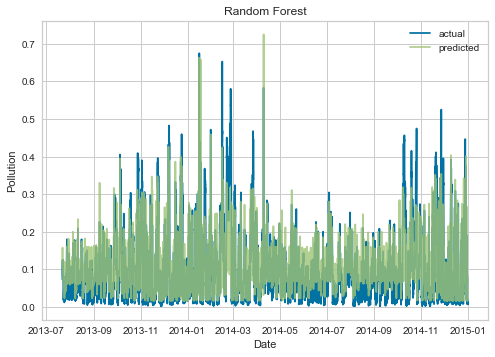

In [22]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.datasets import make_regression

rf_model = RandomForestRegressor(max_depth=7, random_state=0)
rf_model.fit(X_train,y_train)
pred_val_rf = rf_model.predict(X_test)

mean_squared_error_rf = mean_squared_error(y_test, pred_val_rf)
rmse_rf = math.sqrt(mean_squared_error_rf)
print('mean_squared_error: %.4f' % mean_squared_error_rf)
print('Test RMSE: %.4f' % rmse_rf)
error = mae(y_test, pred_val_rf)
print("Mean absolute error : " + str(error))

plt.plot(x.Date,y_test,label='actual')
plt.plot(x.Date,pred_val_rf,label='predicted',alpha=0.8)
plt.legend(loc="upper right")
plt.xlabel('Date')
plt.ylabel('Pollution')
plt.title("Random Forest")

mean_squared_error: 0.0052
Test RMSE: 0.0718
Mean absolute error : 0.05574062941165406


Text(0.5, 1.0, 'SVM')

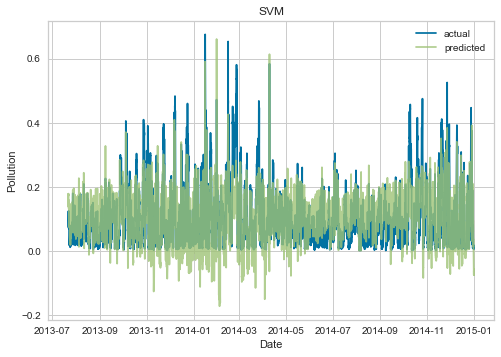

In [23]:
from sklearn import svm

svm_model = svm.SVR()
svm_model.fit(X_train,y_train)
pred_val_svm = svm_model.predict(X_test)

mean_squared_error_lr = mean_squared_error(y_test, pred_val_svm)
rmse = math.sqrt(mean_squared_error_lr)
print('mean_squared_error: %.4f' % mean_squared_error_lr)
print('Test RMSE: %.4f' % rmse)
error = mae(y_test, pred_val_svm)
print("Mean absolute error : " + str(error))

plt.plot(x.Date,y_test,label='actual')
plt.plot(x.Date,pred_val_svm,label='predicted',alpha=0.8)
plt.legend(loc="upper right")
plt.xlabel('Date')
plt.ylabel('Pollution')
plt.title("SVM")

mean_squared_error: 0.0038
Test RMSE: 0.0613
Mean absolute error : 0.041966354677127456


Text(0.5, 1.0, 'Gredient Boosting')

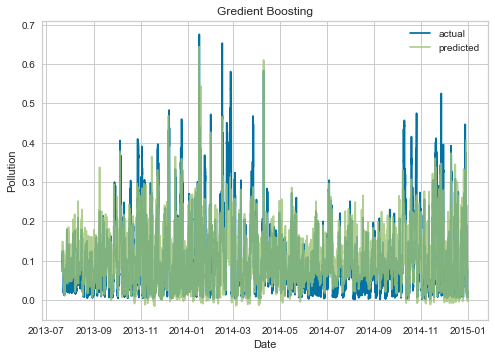

In [24]:
from sklearn.datasets import make_regression
from sklearn.ensemble import GradientBoostingRegressor

reg_model = GradientBoostingRegressor(random_state=0)
reg_model.fit(X_train,y_train)
pred_val_geBoos = reg_model.predict(X_test)

mean_squared_error_lr = mean_squared_error(y_test, pred_val_geBoos)
rmse = math.sqrt(mean_squared_error_lr)
print('mean_squared_error: %.4f' % mean_squared_error_lr)
print('Test RMSE: %.4f' % rmse)
error = mae(y_test, pred_val_geBoos)
print("Mean absolute error : " + str(error))

plt.plot(x.Date,y_test,label='actual')
plt.plot(x.Date,pred_val_geBoos,label='predicted',alpha=0.8)
plt.legend(loc="upper right")
plt.xlabel('Date')
plt.ylabel('Pollution')
plt.title("Gredient Boosting")

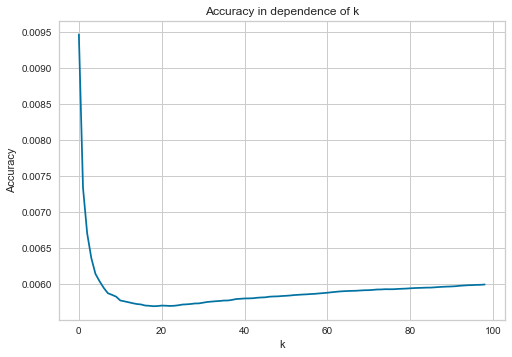

In [31]:
def mse(y_pred,y):
    return np.mean((y_pred-y)**2)


error = []
for i in range(1, 100):
    knn = KNeighborsRegressor(n_neighbors=i)
    knn.fit(X_train,y_train)
    predicted = knn.predict(X_test)
    error.append(mse(predicted, y_test))
    
plt.title("Accuracy in dependence of k")
plt.plot(error)
plt.xlabel("k")
plt.ylabel("Accuracy")
plt.show()

mean_squared_error: 0.0057
Test RMSE: 0.0755
Mean absolute error : 0.05410493


Text(0.5, 1.0, 'K_Neighbor')

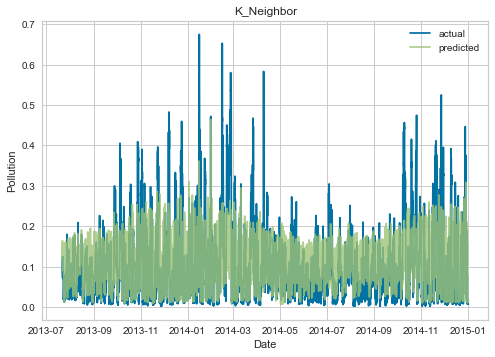

In [33]:
from sklearn.neighbors import KNeighborsRegressor

neigh = KNeighborsRegressor(n_neighbors=18)
neigh.fit(X_train,y_train)
pred_val_neigh= neigh.predict(X_test)

mean_squared_error_lr = mean_squared_error(y_test, pred_val_neigh)
rmse = math.sqrt(mean_squared_error_lr)
print('mean_squared_error: %.4f' % mean_squared_error_lr)
print('Test RMSE: %.4f' % rmse)
error = mae(y_test, pred_val_neigh)
print("Mean absolute error : " + str(error))

plt.plot(x.Date,y_test,label='actual')
plt.plot(x.Date,pred_val_neigh,label='predicted',alpha=0.8)
plt.legend(loc="upper right")
plt.xlabel('Date')
plt.ylabel('Pollution')
plt.title("K_Neighbor")

In [35]:
import plotly.offline as pyoff
import plotly.graph_objs as go

fig = go.Figure()


fig.add_trace(go.Scatter(x=x.Date, y=y_test, name='True',))
fig.add_trace(go.Scatter(x=x.Date, y=pred_val, name='Linear Regression',))
fig.add_trace(go.Scatter(x=x.Date, y=pred_val_dt, name='Decision Tree',))
fig.add_trace(go.Scatter(x=x.Date, y=pred_val_rf, name='Random Forest',))
fig.add_trace(go.Scatter(x=x.Date, y=pred_val_svm, name='Support Vector Machine',))
fig.add_trace(go.Scatter(x=x.Date, y=pred_val_geBoos, name='Geradient Boosting',))
fig.add_trace(go.Scatter(x=x.Date, y=pred_val_neigh, name='K_Neighbor',))

fig.show()